In [ ]:
!pip3 install scikit-learn

In [ ]:
import sklearn.datasets
import sklearn.metrics

import pandas as pd
import matplotlib.pyplot as plt
import torch
from sklearn.model_selection import train_test_split
from sklearn.utils import resample
import numpy as np

from sklearn.model_selection import RandomizedSearchCV

In [ ]:
df = pd.read_csv("dataset_a.csv")
df

,ID,subject,race,age,x_0,y_0,x_1,y_1,x_2,y_2,x_3,y_3,x_4,y_4,x_5,y_5,x_6,y_6,x_7,y_7,x_8,y_8,x_9,y_9,x_10,y_10,x_11,y_11,x_12,y_12,x_13,y_13,x_14,y_14,x_15,y_15,x_16,y_16,x_17,y_17,...,y_48,x_49,y_49,x_50,y_50,x_51,y_51,x_52,y_52,x_53,y_53,x_54,y_54,x_55,y_55,x_56,y_56,x_57,y_57,x_58,y_58,x_59,y_59,x_60,y_60,x_61,y_61,x_62,y_62,x_63,y_63,x_64,y_64,x_65,y_65,x_66,y_66,x_67,y_67,Label
0,64,6,-1,0,0.0,0.376222,0.022801,0.493485,0.047231,0.600977,0.086319,0.703583,0.153094,0.785016,0.254072,0.835505,0.377850,0.864821,0.493485,0.889251,0.609121,0.897394,0.714984,0.884365,0.807818,0.845277,0.890879,0.791531,0.942997,0.721498,0.972313,0.635179,0.985342,0.545603,0.998371,0.452769,1.000000,0.363192,0.153094,0.133551,...,0.591205,0.513029,0.496743,0.586319,0.452769,0.628665,0.462541,0.664495,0.456026,0.719870,0.500000,0.749186,0.597720,0.714984,0.641694,0.661238,0.651466,0.622150,0.651466,0.579805,0.649837,0.511401,0.633550,0.482085,0.581433,0.583062,0.496743,0.623779,0.496743,0.659609,0.501629,0.719870,0.583062,0.661238,0.607492,0.623779,0.609121,0.583062,0.605863,1
1,65,6,-1,0,0.0,0.167085,0.008794,0.293970,0.018844,0.414573,0.031407,0.532663,0.076633,0.633166,0.155779,0.711055,0.257538,0.770100,0.358040,0.829146,0.472362,0.854271,0.581658,0.845477,0.682161,0.798995,0.788945,0.752513,0.865578,0.682161,0.913317,0.592965,0.942211,0.491206,0.972362,0.388191,1.000000,0.281407,0.110553,0.074121,...,0.604271,0.423367,0.557789,0.487437,0.533920,0.523869,0.548995,0.562814,0.545226,0.611809,0.582915,0.658291,0.641960,0.600502,0.660804,0.548995,0.663317,0.510050,0.660804,0.471106,0.653266,0.413317,0.635678,0.388191,0.597990,0.481156,0.574121,0.517588,0.582915,0.556533,0.585427,0.626884,0.630653,0.555276,0.608040,0.517588,0.604271,0.481156,0.596734,1
2,66,6,-1,0,0.0,0.317910,0.010448,0.431343,0.022388,0.537313,0.047761,0.638806,0.098507,0.726866,0.189552,0.783582,0.310448,0.811940,0.428358,0.841791,0.552239,0.853731,0.665672,0.849254,0.768657,0.828358,0.864179,0.794030,0.922388,0.732836,0.955224,0.649254,0.971642,0.564179,0.988060,0.479104,1.000000,0.394030,0.150746,0.104478,...,0.570149,0.489552,0.494030,0.559702,0.455224,0.598507,0.467164,0.637313,0.461194,0.688060,0.507463,0.723881,0.597015,0.677612,0.604478,0.625373,0.600000,0.586567,0.597015,0.546269,0.594030,0.482090,0.589552,0.446269,0.559702,0.553731,0.505970,0.592537,0.507463,0.631343,0.511940,0.694030,0.577612,0.631343,0.558209,0.592537,0.553731,0.553731,0.550746,1
3,67,6,-1,1,0.0,0.223947,0.006652,0.343681,0.022173,0.458980,0.037694,0.567627,0.070953,0.669623,0.135255,0.749446,0.230599,0.804878,0.330377,0.849224,0.439024,0.869180,0.545455,0.862528,0.651885,0.835920,0.762749,0.798226,0.847007,0.738359,0.904656,0.651885,0.940133,0.554324,0.971175,0.450111,1.000000,0.339246,0.115299,0.079823,...,0.585366,0.385809,0.525499,0.447894,0.496674,0.481153,0.509978,0.523282,0.507760,0.574279,0.547672,0.616408,0.616408,0.560976,0.643015,0.507760,0.651885,0.465632,0.649667,0.427938,0.643015,0.372506,0.625277,0.350333,0.580931,0.441242,0.536585,0.476718,0.543237,0.516630,0.547672,0.585366,0.605322,0.514412,0.600887,0.472284,0.600887,0.436807,0.594235,1
4,68,6,-1,1,0.0,0.249453,0.017505,0.363239,0.035011,0.466083,0.048140,0.568928,0.083151,0.663020,0.148796,0.728665,0.240700,0.776805,0.339168,0.814004,0.446390,0.827133,0.560175,0.809628,0.667396,0.776805,0.774617,0.739606,0.855580,0.678337,0.905908,0.584245,0.938731,0.477024,0.969365,0.365427,1.000000,0.242888,0.048140,0.126915,...,0.553611,0.339168,0.474836,0.393873,0.437637,0.439825,0.444201,0.483589,0.435449,0.547046,0.466083,0.606127,0.540481,0.549234,0.579869,0.487965,0.595186,0.439825,0.599562,0.393873,0.599562,0.341357,0.590810,0.332604,0.542670,0.396061,0.474836,0.439825,0.472648,0.483589,0.470460,0.575492,0.531729,0.483589,0.551422,0.439825,0.555799,0.393873,0.555799,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [ ]:
df = df.iloc[: , 1:]

In [ ]:
# Count records for respective categories
count_false = len(df[df['Label'] == 0])
count_true = len(df[df['Label'] == 1])
print(count_false, count_true)

1801 605


In [ ]:
# Upsample 'True' class data to handle imbalance classification problem

# Separate majority and minority classes
df_majority = df[df.Label==0]
df_minority = df[df.Label==1]
 
# Upsample minority class
df_minority_upsampled = resample(df_minority, 
                                 replace=1,     # sample with replacement
                                 n_samples=1801,    # to match majority class
                                 random_state=123) # reproducible results
 
# Combine majority class with upsampled minority class
df_upsampled = pd.concat([df_majority, df_minority_upsampled])
 
# Display new class counts
df_upsampled.Label.value_counts()

1    1801
0    1801
Name: Label, dtype: int64

In [ ]:
y = df['Label']

In [ ]:

X = df.drop('Label', axis=1)
X

,subject,race,age,x_0,y_0,x_1,y_1,x_2,y_2,x_3,y_3,x_4,y_4,x_5,y_5,x_6,y_6,x_7,y_7,x_8,y_8,x_9,y_9,x_10,y_10,x_11,y_11,x_12,y_12,x_13,y_13,x_14,y_14,x_15,y_15,x_16,y_16,x_17,y_17,x_18,...,x_48,y_48,x_49,y_49,x_50,y_50,x_51,y_51,x_52,y_52,x_53,y_53,x_54,y_54,x_55,y_55,x_56,y_56,x_57,y_57,x_58,y_58,x_59,y_59,x_60,y_60,x_61,y_61,x_62,y_62,x_63,y_63,x_64,y_64,x_65,y_65,x_66,y_66,x_67,y_67
0,6,-1,0,0.0,0.376222,0.022801,0.493485,0.047231,0.600977,0.086319,0.703583,0.153094,0.785016,0.254072,0.835505,0.377850,0.864821,0.493485,0.889251,0.609121,0.897394,0.714984,0.884365,0.807818,0.845277,0.890879,0.791531,0.942997,0.721498,0.972313,0.635179,0.985342,0.545603,0.998371,0.452769,1.000000,0.363192,0.153094,0.133551,0.218241,...,0.451140,0.591205,0.513029,0.496743,0.586319,0.452769,0.628665,0.462541,0.664495,0.456026,0.719870,0.500000,0.749186,0.597720,0.714984,0.641694,0.661238,0.651466,0.622150,0.651466,0.579805,0.649837,0.511401,0.633550,0.482085,0.581433,0.583062,0.496743,0.623779,0.496743,0.659609,0.501629,0.719870,0.583062,0.661238,0.607492,0.623779,0.609121,0.583062,0.605863
1,6,-1,0,0.0,0.167085,0.008794,0.293970,0.018844,0.414573,0.031407,0.532663,0.076633,0.633166,0.155779,0.711055,0.257538,0.770100,0.358040,0.829146,0.472362,0.854271,0.581658,0.845477,0.682161,0.798995,0.788945,0.752513,0.865578,0.682161,0.913317,0.592965,0.942211,0.491206,0.972362,0.388191,1.000000,0.281407,0.110553,0.074121,0.183417,...,0.355528,0.604271,0.423367,0.557789,0.487437,0.533920,0.523869,0.548995,0.562814,0.545226,0.611809,0.582915,0.658291,0.641960,0.600502,0.660804,0.548995,0.663317,0.510050,0.660804,0.471106,0.653266,0.413317,0.635678,0.388191,0.597990,0.481156,0.574121,0.517588,0.582915,0.556533,0.585427,0.626884,0.630653,0.555276,0.608040,0.517588,0.604271,0.481156,0.596734
2,6,-1,0,0.0,0.317910,0.010448,0.431343,0.022388,0.537313,0.047761,0.638806,0.098507,0.726866,0.189552,0.783582,0.310448,0.811940,0.428358,0.841791,0.552239,0.853731,0.665672,0.849254,0.768657,0.828358,0.864179,0.794030,0.922388,0.732836,0.955224,0.649254,0.971642,0.564179,0.988060,0.479104,1.000000,0.394030,0.150746,0.104478,0.220896,...,0.413433,0.570149,0.489552,0.494030,0.559702,0.455224,0.598507,0.467164,0.637313,0.461194,0.688060,0.507463,0.723881,0.597015,0.677612,0.604478,0.625373,0.600000,0.586567,0.597015,0.546269,0.594030,0.482090,0.589552,0.446269,0.559702,0.553731,0.505970,0.592537,0.507463,0.631343,0.511940,0.694030,0.577612,0.631343,0.558209,0.592537,0.553731,0.553731,0.550746
3,6,-1,1,0.0,0.223947,0.006652,0.343681,0.022173,0.458980,0.037694,0.567627,0.070953,0.669623,0.135255,0.749446,0.230599,0.804878,0.330377,0.849224,0.439024,0.869180,0.545455,0.862528,0.651885,0.835920,0.762749,0.798226,0.847007,0.738359,0.904656,0.651885,0.940133,0.554324,0.971175,0.450111,1.000000,0.339246,0.115299,0.079823,0.184035,...,0.323725,0.585366,0.385809,0.525499,0.447894,0.496674,0.481153,0.509978,0.523282,0.507760,0.574279,0.547672,0.616408,0.616408,0.560976,0.643015,0.507760,0.651885,0.465632,0.649667,0.427938,0.643015,0.372506,0.625277,0.350333,0.580931,0.441242,0.536585,0.476718,0.543237,0.516630,0.547672,0.585366,0.605322,0.514412,0.600887,0.472284,0.600887,0.436807,0.594235
4,6,-1,1,0.0,0.249453,0.017505,0.363239,0.035011,0.466083,0.048140,0.568928,0.083151,0.663020,0.148796,0.728665,0.240700,0.776805,0.339168,0.814004,0.446390,0.827133,0.560175,0.809628,0.667396,0.776805,0.774617,0.739606,0.855580,0.678337,0.905908,0.584245,0.938731,0.477024,0.969365,0.365427,1.000000,0.242888,0.048140,0.126915,0.091904,...,0.304158,0.553611,0.339168,0.474836,0.393873,0.437637,0.439825,0.444201,0.483589,0.435449,0.547046,0.466083,0.606127,0.540481,0.549234,0.579869,0.487965,0.595186,0.439825,0.599562,0.393873,0.599562,0.341357,0.590810,0.332604,0.542670,0.396061,0.474836,0.439825,0.472648,0.483589,0.470460,0.575492,0.531729,0.483589,0.551422,0.439825,0.555799,0.393873,0.555799
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.2)


In [ ]:
print(X_train,y_train)

      subject  race  age       x_0  ...      x_66      y_66      x_67      y_67
2021      177    -1    2  0.000000  ...  0.435798  0.595331  0.396887  0.591440
2394     1690     0    2  0.000000  ...  0.520921  0.556485  0.479079  0.550209
313      1615     0    6  0.000000  ...  0.503546  0.553191  0.460993  0.553191
536         5    -1    0  0.000000  ...  0.501859  0.643123  0.446097  0.639405
906      1048    -1    4  0.000000  ...  0.407407  0.583333  0.351852  0.583333
...       ...   ...  ...       ...  ...       ...       ...       ...       ...
1225      103     0    5  0.000000  ...  0.510345  0.603448  0.462069  0.600000
2155     1733     0    3  0.000000  ...  0.545455  0.643939  0.492424  0.636364
1127      811    -1    3  0.000000  ...  0.563441  0.623656  0.509677  0.619355
1934       45    -1    5  0.000000  ...  0.387226  0.583832  0.335329  0.572854
1800     1483     1    7  0.007519  ...  0.375940  0.661654  0.338346  0.654135

[1924 rows x 139 columns] 2021    0
239

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
clf = RandomForestClassifier(max_depth=2, random_state=0)

In [ ]:
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=2, random_state=0)

In [ ]:
df.columns[:-1]

Index(['subject', 'race', 'age', 'x_0', 'y_0', 'x_1', 'y_1', 'x_2', 'y_2',
       'x_3',
       ...
       'x_63', 'y_63', 'x_64', 'y_64', 'x_65', 'y_65', 'x_66', 'y_66', 'x_67',
       'y_67'],
      dtype='object', length=139)

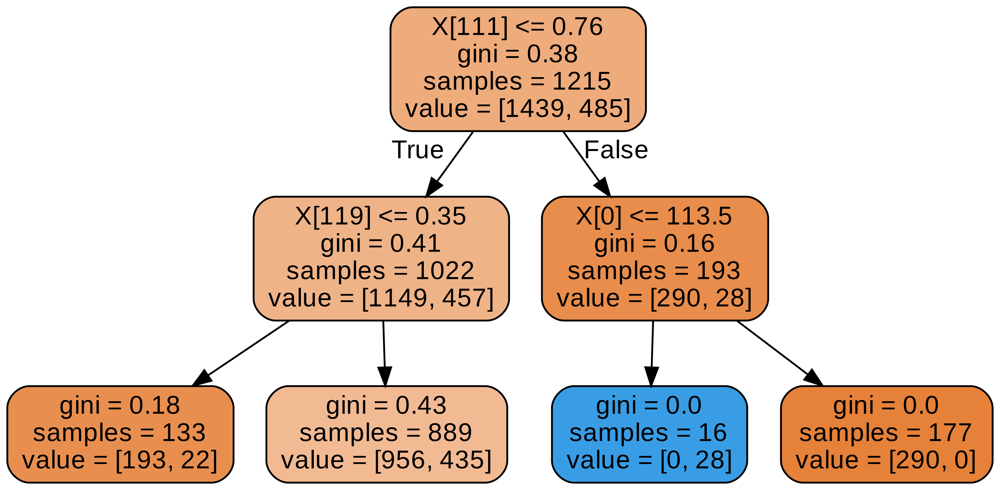

In [ ]:
estimator = clf.estimators_[10]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot',rounded = True, proportion = False, precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [ ]:
predictions = clf.predict(X_test)
print("Accuracy score:", sklearn.metrics.accuracy_score(y_test, predictions))
from sklearn.metrics import f1_score,confusion_matrix,recall_score,precision_score,classification_report
print(sklearn.metrics.f1_score(y_test, predictions))
print(sklearn.metrics.confusion_matrix(y_test, predictions))
print(sklearn.metrics.recall_score(y_test, predictions))
print(sklearn.metrics.classification_report(y_test, predictions))

Accuracy score: 0.7655601659751037
0.2097902097902098
[[354   0]
 [113  15]]
0.1171875
              precision    recall  f1-score   support

           0       0.76      1.00      0.86       354
           1       1.00      0.12      0.21       128

    accuracy                           0.77       482
   macro avg       0.88      0.56      0.54       482
weighted avg       0.82      0.77      0.69       482



In [ ]:
# Model fitting and finding best parameters using K-fold cross validation

# Defining random forest model with a variable
clf = RandomForestClassifier()

# number of decision trees/ estimators
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 1000, num = 10)]

# number of features at every split
max_features = ['auto', 'sqrt']

# max depth
max_depth = [int(x) for x in np.linspace(1, 25, num = 9)]
max_depth.append(None)

# create random grid
random_grid = {
 'n_estimators': n_estimators,
 'max_features': max_features,
 'max_depth': max_depth
 }

# Random search of parameters
clf_random = RandomizedSearchCV(estimator = clf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)# Fit the model
clf_random.fit(X_train, y_train)# print results
print(clf_random.best_params_)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
{'n_estimators': 230, 'max_features': 'sqrt', 'max_depth': 25}


In [ ]:
# Train model using best parameters calculated using cross validation
clf = RandomForestClassifier(n_estimators=120, max_features='auto', max_depth=22)
clf.fit(X_train, y_train)
 
# Predict on training set
y_pred = clf.predict(X_test)
 
# Check if prediction is made for each of the classes present
print( np.unique( y_pred ) )

[0 1]


In [ ]:
estimator = clf.estimators_[10]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot',rounded = True, proportion = False, precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [ ]:
# Accuracy of model
from sklearn.metrics import accuracy_score
print( accuracy_score(y_test, y_pred) )

0.995850622406639


In [ ]:
# Final metric for classification
from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       353
           1       1.00      0.98      0.99       129

    accuracy                           1.00       482
   macro avg       1.00      0.99      0.99       482
weighted avg       1.00      1.00      1.00       482

